<img src="img/header_escom26.jpg" alt="header" style="height:200px;">

# Image Analysis

**Dr. Flavio Arturo Sánchez Garfias**

01 - Numpy and images

**Import <a href="https://numpy.org">NumPy</a>, <a href="https://matplotlib.org">matplotlib</a> and Image from <a href="https://pillow.readthedocs.io/en/stable/">PIL</a>**

In [7]:
from jupyterthemes import get_themes
import jupyterthemes as jt
from jupyterthemes.stylefx import set_nb_theme

import numpy as np
import scipy as snp
import matplotlib.pyplot as plt
%matplotlib inline
from PIL import Image
%load_ext Cython

The Cython extension is already loaded. To reload it, use:
  %reload_ext Cython


In [8]:
# uncomment and execute line to try a new theme
#set_nb_theme('onedork')
#set_nb_theme('chesterish')
#set_nb_theme('grade3')
#set_nb_theme('oceans16')
#set_nb_theme('solarizedl')
#set_nb_theme('solarizedd')
#set_nb_theme('monokai')

**Using PIL and matplotlib to read and display images.**

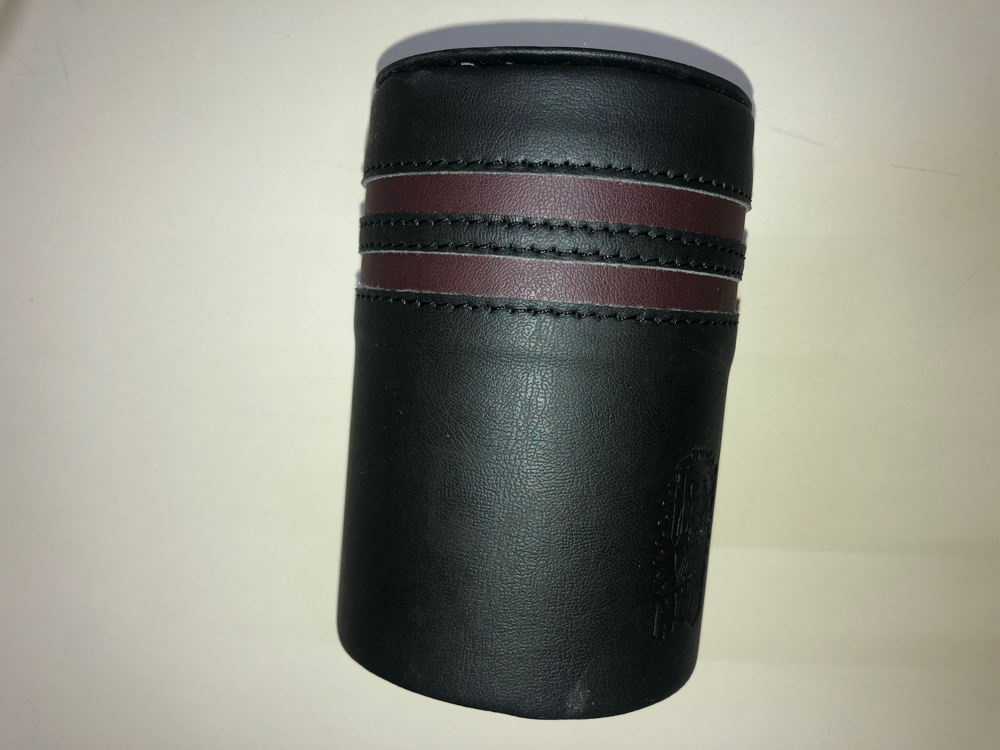

In [9]:
filepath="./img/" #The current directory
#filename="mark.jpeg" #The File name
filename="vaso.jpg" #The File name
#filename="coins.png"
#filename="otsu3.png"
#filename="pre_otsu.png"
pic=Image.open(filepath+filename) #Open the image
pic #Diplays the image in the notebook

**Converting the image to an array and print its properties**

In [10]:
print("Image type:"+str(type(pic))) #Displays the type of image (JPEG, BMP, PNG, GIF, etc)
pic_arr = snp.asarray(pic) #converts the image to an Numpy Array
print("Dimentions"+str(pic_arr.shape)) #(height,width,#of channels)
pic_channels=1
if pic_arr.ndim>2:
    pic_channels=3
print("Channels:"+str(pic_channels))

Image type:<class 'PIL.JpegImagePlugin.JpegImageFile'>
Dimentions(3024, 4032, 3)
Channels:3


In [11]:
#Displays an array as an image
def im_show(pic):
    channels=1
    if pic.ndim>2:
        channels=3
    if channels==1:
        plt.imshow(pic,cmap='gray')
    else:
        plt.imshow(pic)

In [12]:
type(pic_arr) #The image is now an array

numpy.ndarray

In [13]:
pic_arr #Display the values of the image

array([[[145, 137, 124],
        [144, 136, 123],
        [144, 136, 123],
        ...,
        [159, 155, 144],
        [158, 154, 143],
        [158, 154, 143]],

       [[144, 136, 123],
        [144, 136, 123],
        [143, 135, 122],
        ...,
        [158, 154, 143],
        [158, 154, 143],
        [158, 154, 143]],

       [[143, 135, 122],
        [143, 135, 122],
        [143, 135, 122],
        ...,
        [158, 154, 143],
        [158, 154, 143],
        [158, 154, 143]],

       ...,

       [[156, 152, 143],
        [156, 152, 143],
        [156, 152, 143],
        ...,
        [150, 143, 127],
        [150, 143, 127],
        [150, 143, 127]],

       [[156, 152, 143],
        [156, 152, 143],
        [156, 152, 143],
        ...,
        [150, 143, 127],
        [150, 143, 127],
        [150, 143, 127]],

       [[156, 152, 143],
        [156, 152, 143],
        [156, 152, 143],
        ...,
        [150, 143, 127],
        [150, 142, 129],
        [150, 142, 129]]

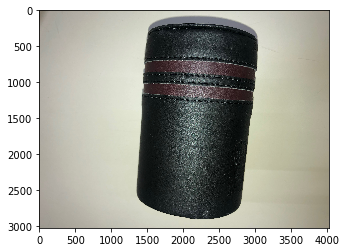

In [14]:
im_show(pic_arr) #Display the array as an image

**Using slicing to set the GREEN and BLUE channels of the picture to 0, then using imshow() to show the isolated RED channel**

In [15]:
pic_red=pic_arr.copy()
#pic_red=pic_red[:,:,0] #0=red
#plt.imshow(pic_red,cmap='gray') #as grayscale
pic_red[:,:,1]=0
pic_red[:,:,2]=0
#plt.imshow(pic_red)

**Using slicing to set the RED and BLUE channels of the picture to 0, then using imshow() to show the isolated GREEN channel**

In [16]:
pic_green=pic_arr.copy()
#pic_green=pic_green[:,:,1] #1=green
#plt.imshow(pic_green,cmap='gray') #as grayscale
pic_green[:,:,0]=0
pic_green[:,:,2]=0
#plt.imshow(pic_green)

**Using slicing to set the RED and GREEN channels of the picture to 0, then using imshow() to show the isolated BLUE channel**

In [17]:
pic_blue=pic_arr.copy()
#pic_blue=pic_blue[:,:,2] #2=blue
#plt.imshow(pic_blue,cmap='gray') #as grayscale
pic_blue[:,:,0]=0
pic_blue[:,:,1]=0
#plt.imshow(pic_blue)

**Displays the three channels isolate. Loook for information about subplots in <a href="https://matplotlib.org">matplotlib.org</a> ***

Text(0.5, 0.98, 'Image channels')

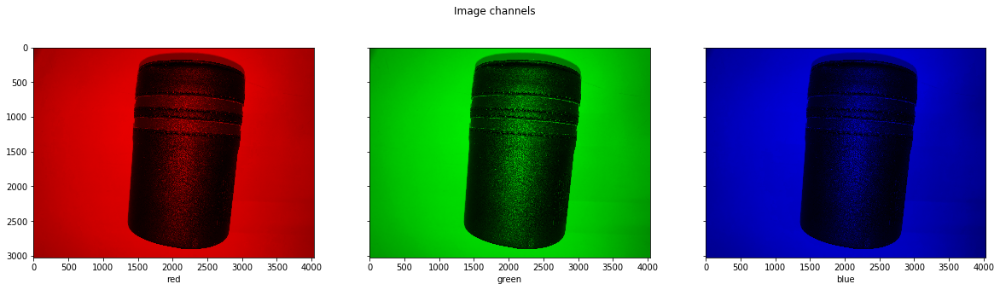

In [18]:
fig, axs = plt.subplots(1, 3, figsize=(20,5), sharey=True)
axs[0].imshow(pic_red)
axs[0].set_xlabel("red")
axs[1].imshow(pic_green)
axs[1].set_xlabel("green")
axs[2].imshow(pic_blue)
axs[2].set_xlabel("blue")
fig.suptitle('Image channels')

**Calculating the histograms for the three channels and displays them**

In [19]:
%%cython -a
import numpy as np
def histogram(pic) :
    #Get the height and the width
    cdef height=pic.shape[0]
    cdef width=pic.shape[1]
    cdef hw=height*width
    cdef channels=1
    cdef i,j
    if pic.ndim==3:
        channels=pic.shape[2]        
    
    #hist=np.zeros((channels,256))
        
    if channels==1:
        hist=np.zeros(256)
        for i in range(0,height):   #FOR EVERY ROW   
            for j in range(0,width):   #FOR EVERY COLUMN        
                hist[pic[i,j]]+=1
    else:
        hist=np.zeros((channels,256))
        for i in range(0,height):   #FOR EVERY ROW   
            for j in range(0,width):   #FOR EVERY COLUMN
                for c in range(0,channels): #FOR EVERY CHANNEL
                    hist[c,pic[i,j,c]]+=1
    
    return hist/(hw)

Get the histogram..
CPU times: user 37.8 s, sys: 632 ms, total: 38.4 s
Wall time: 39.8 s


Text(0.5, 0.98, 'Histogram channels')

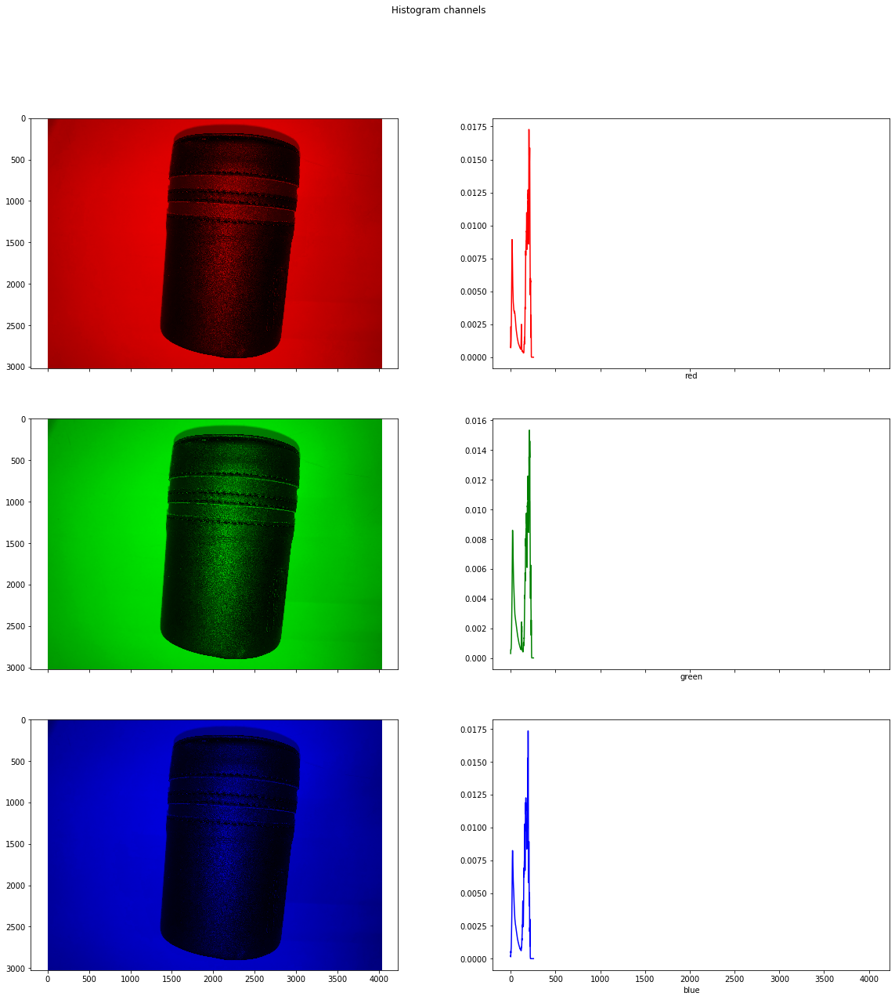

In [20]:
#Get the histogram
print("Get the histogram..")
%time hist=histogram(pic_arr)

channels=1
colors=["gray"]
if pic_arr.ndim==3:
    channels=pic_arr.shape[2]
    if channels>3:
        channels=3
    colors=["red","green","blue"]

fig, axs = plt.subplots(channels, 2,figsize=(20,20), sharex=True)
for i in range(0,channels):
    if channels==3:
        if i==0:
            axs[i,0].imshow(pic_red)
        if i==1:
            axs[i,0].imshow(pic_green)    
        if i==2:
            axs[i,0].imshow(pic_blue)
    else:
        axs[i,0].imshow(pic_arr,cmap="gray")
    axs[i,1].plot(hist[i],color = colors[i])
    axs[i,1].set_xlabel(colors[i])
#axs[1].plot(hist[1],color = colors[1])
#axs[1].set_xlabel(colors[1])
#axs[2].plot(hist[2],color = colors[2])
#axs[2].set_xlabel(colors[2])
fig.suptitle('Histogram channels')

**An alternative display the histograms in the same plot**

Of course, if you are working with a grayscale image you'll get a single blue plot

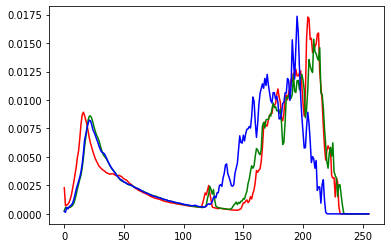

In [21]:
#Displaing the histogram in a single plot

plt.plot(hist[0],color = "r")
plt.plot(hist[1],color = "g")
plt.plot(hist[2],color = "b")
plt.show()


**Converting an color image to grayscale**

In [22]:
%%cython -a
import numpy as np
def grayscale(const unsigned char[:,:,:] pic):
    cdef int height=pic.shape[0]
    cdef int width=pic.shape[1]
    cdef int i,j
    
    cdef int channels=1
    if pic.ndim==3:
        channels=pic.shape[2]
    
    cdef pic2=np.zeros((height,width),dtype=np.uint8)
    
    if channels==1:
        return pic
    else:        
        for i in range(height):   #FOR EVERY ROW   
            for j in range(width):   #FOR EVERY COLUMN
                pic2[i,j]=int(0.2126*float(pic[i,j,0])+0.7152*float(pic[i,j,1])+0.0722*float(pic[i,j,2]))

    return pic2

To grayscale
CPU times: user 2.52 s, sys: 35.7 ms, total: 2.56 s
Wall time: 2.61 s
Get the histogram
CPU times: user 11.8 s, sys: 143 ms, total: 11.9 s
Wall time: 12 s


Text(0.5, 0.98, 'Image vs Histogram')

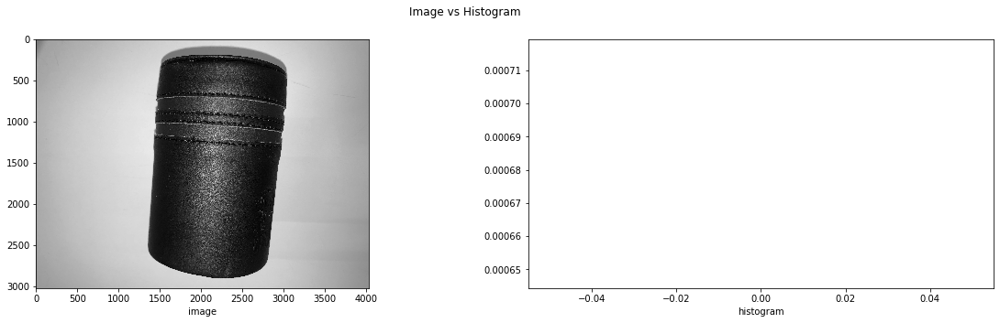

In [23]:
print("To grayscale")
%time pic_gray=grayscale(pic_arr)
print("Get the histogram")
%time hist=histogram(pic_gray)

fig, axs = plt.subplots(1, 2, figsize=(20,5))
axs[0].imshow(pic_gray,cmap="gray")
axs[0].set_xlabel("image")
axs[1].plot(hist[0],color = "gray")
axs[1].set_xlabel("histogram")

fig.suptitle('Image vs Histogram')

#plt.imshow(pic_gray)

**A first aproximation for thresholding**

In [24]:
def threshold(pic, T) :    
    height=pic.shape[0]
    width=pic.shape[1]  
        
    hw=height*width

    pic2=pic.copy()

    for i in range(height):   #FOR EVERY ROW   
        for j in range(width):   #FOR EVERY COLUMN
            if pic[i,j]<T: #IF THE PIXELS VALUE IS LESS THAN THE THRESHOLD T
                pic2[i,j]=0   #SET TO 0
            else:
                pic2[i,j]=255 #SET TO 255
            
    return pic2

In [25]:
%%cython -a
import numpy as np
def threshold_cython(const unsigned char[:,:] pic, const unsigned char T) :    
    cdef int height=pic.shape[0]
    cdef int width=pic.shape[1]  
    cdef int i
    cdef int j
        
    cdef int hw=height*width

    cdef pic2=pic.copy()

    for i in range(height):   #FOR EVERY ROW   
        for j in range(width):   #FOR EVERY COLUMN
            if pic[i,j]<T: #IF THE PIXELS VALUE IS LESS THAN THE THRESHOLD T
                pic2[i,j]=0   #SET TO 0
            else:
                pic2[i,j]=255 #SET TO 255
    
    return pic2

Manual Thresholding..Python
CPU times: user 53.6 s, sys: 431 ms, total: 54.1 s
Wall time: 55.9 s
Manual Thresholding..Cython
CPU times: user 3.37 s, sys: 48.1 ms, total: 3.41 s
Wall time: 3.48 s


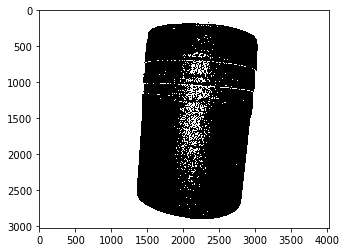

In [26]:
T=110 #The Threshold
#print(pic_gray[5000,5000,0])

print("Manual Thresholding..Python")
%time pic_arr2=threshold(pic_gray,T)
print("Manual Thresholding..Cython")
%time pic_arr2=threshold_cython(pic_gray,T)

plt.imshow(pic_arr2,cmap="gray")

In [27]:
%%cython -a
import numpy as np
from __main__ import histogram

def otsu(const unsigned char[:,:]pic):
    cdef hist=histogram(pic)
    cdef float w0=0
    cdef float w1=1
    cdef float Vmax=0
    cdef int T=0
    cdef float m0=0
    cdef float m1=0
    cdef float V=0
    for i in range(0,255):
        m0=hist[0:i+1].mean()
        m1=hist[i+1:256].mean()
        V=w0*w1*((m0-m1)*(m0-m1))
        if (V>Vmax):
            Vmax=V
            T=i       
        w0+=hist[i]
        w1-=hist[i]
    
    return T 

In [28]:
#import cv2

#img = cv2.imread('./coins.PNG')
#plt.imshow(img)
#color = ('b','g','r')
#for i,col in enumerate(color):
#    histr = cv2.calcHist([img],[i],None,[256],[0,256])
#    plt.plot(histr,color = col)
#    plt.xlim([0,256])
#plt.show()

Get the Otsu's threshold
CPU times: user 12 s, sys: 197 ms, total: 12.2 s
Wall time: 12.5 s
The Otsu's Threshold: 163
Thresholding..
CPU times: user 3.32 s, sys: 44.6 ms, total: 3.37 s
Wall time: 3.39 s


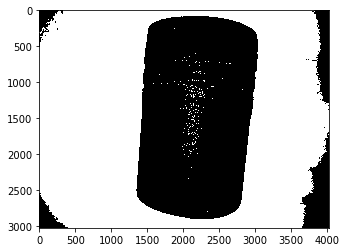

In [29]:
#OTSU´s METHOD
print("Get the Otsu's threshold")
%time T=otsu(pic_gray)
print("The Otsu's Threshold: "+str(T))

print("Thresholding..")
%time pic_arr2=threshold_cython(pic_gray,T)
plt.imshow(pic_arr2,cmap="gray")

## Great Job!

In [30]:
def fibonacci(n):
    if n < 0:
        print("1st fibonacci number = 0")
    elif n == 1:
        return 0
    elif n == 2:
        return 1
    else:
        return fibonacci(n-1) + fibonacci(n-2)

In [31]:
%%time 
fibonacci(39)

CPU times: user 27.3 s, sys: 124 ms, total: 27.4 s
Wall time: 27.6 s


39088169

In [32]:
%%cython -a
def fibonacci_c(n):
    if n < 0:
        print("1st fibonacci number = 0")
    elif n == 1:
        return 0
    elif n == 2:
        return 1
    else:
        return fibonacci_c(n-1) + fibonacci_c(n-2)

In [33]:
%%time 
fibonacci_c(39)

CPU times: user 6.86 s, sys: 90.4 ms, total: 6.95 s
Wall time: 7.08 s


39088169

----